In [1]:
from matplotlib import pyplot as plt
%matplotlib inline

In [3]:
%autosave 300

Autosaving every 300 seconds


In [2]:
import numpy as np
import cv2
from PIL import Image
from tqdm.autonotebook import tqdm
import scipy

import torch
import torch.nn.functional as F
import torch.autograd.functional as FD
from torchvision import models, transforms

from captum.attr import NoiseTunnel
from captum.attr import visualization as viz

In [3]:
%load_ext autoreload
%autoreload 2

Downloads the list of classes/labels for ImageNet dataset and reads them into the memory

In [4]:
import requests
imagenet_labels = eval(requests.get('https://gist.githubusercontent.com/yrevar/942d3a0ac09ec9e5eb3a/raw/238f720ff059c1f82f368259d1ca4ffa5dd8f9f5/imagenet1000_clsidx_to_labels.txt').content)

In [5]:
CUDA = torch.cuda.is_available()
if torch.cuda.is_available():
  print("Using GPU.")
else: 
  print("Using CPU.")

Using CPU.


Loads pretrained model and sets it to eval mode

In [6]:
googlenet = models.googlenet(pretrained=True).eval()
if CUDA:
    model.cuda()

Defines transformers and normalizing functions for the image. It also loads an image that will be used for interpretation purposes.

From the [documentation](https://pytorch.org/docs/master/torchvision/models.html):
> All pre-trained models expect input images normalized in the same way, i.e. mini-batches of 3-channel RGB images of shape (3 x H x W), where H and W are expected to be at least 224. The images have to be loaded in to a range of [0, 1] and then normalized using `mean = [0.485, 0.456, 0.406]` and `std = [0.229, 0.224, 0.225]`.

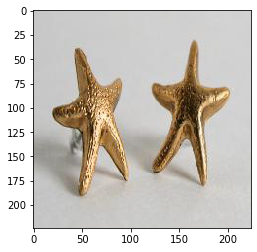

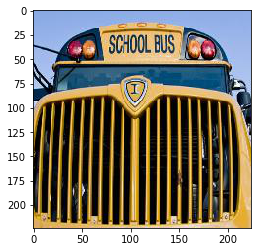

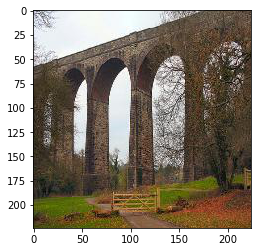

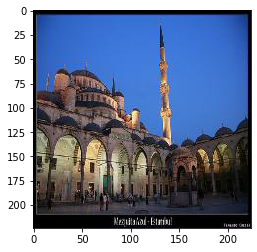

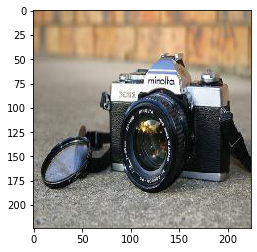

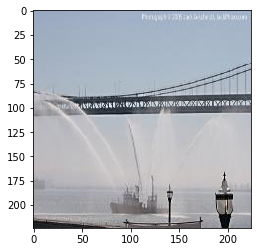

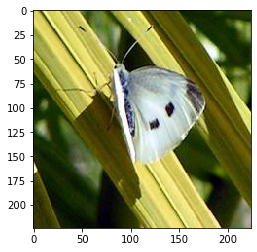

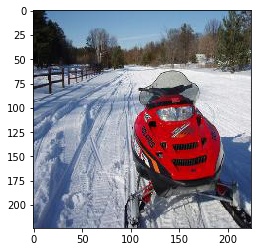

In [106]:
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

normalize = transforms.Normalize(mean, std)
# to correct an overflow error
unnormalize = lambda image: transforms.Normalize(-mean/std, 1/std)(image).clamp(0, 1)

transform = transforms.Compose([
 #transforms.Resize(299),
 transforms.CenterCrop(224),
 transforms.ToTensor(),
 normalize
])

imgs = [
    '2587b0bd7d764bd9',
    '700a04c5c2ca6e80',
    'c0a9ce885a9c26bc',
    '80c64f2e27f8784a',
    '8e570672510267d3',
    '70bfca4555cca92e',
    '1bd6987fa9219dec',
    'ebc7a444a373cea2',
]

img_input = []
for i in range(len(imgs)):
    imgs[i] = Image.open(f'Images/{imgs[i]}.jpg')
    plt.imshow(imgs[i])
    plt.show()
    img_input.append(transform(imgs[i]))
img_input = torch.stack(img_input)

Predict the class of the input image

In [9]:
# Forward pass the data through the model
output = googlenet(img_input)
output = F.softmax(output, dim=1)
score, label_idx = torch.topk(output, 1)
label_idx = label_idx.squeeze(1)

for i in range(len(imgs)):
    predicted_label = imagenet_labels[label_idx[i].item()]
    print('Predicted:', predicted_label, '(', score[i].item(), ')')

Predicted: starfish, sea star ( 0.9940209984779358 )
Predicted: school bus ( 0.596555769443512 )
Predicted: viaduct ( 0.9634000062942505 )
Predicted: mosque ( 0.864380419254303 )
Predicted: reflex camera ( 0.8881484270095825 )
Predicted: fireboat ( 0.9884266257286072 )
Predicted: cabbage butterfly ( 0.8460555076599121 )
Predicted: snowmobile ( 0.936302125453949 )


## Gradient-based attribution

Integrated gradients computes the integral of the gradients of the output of the model for the predicted class `label_idx` with respect to the input image pixels along the path from some baseline image (say all-black) to our input image.

In [38]:
BATCH_SIZE = 1

# https://www.math.ubc.ca/~pwalls/math-python/integration/simpsons-rule/
def straightline_path_int(f, a, b, N, target, simps=True):
    if N % 2 == 1:
        N -= 1
    dx = (b-a)/N
    xs = torch.stack([(1-t)*a + t*b for t in np.linspace(0,1,N)])
    targets = []
    outputs = []
    
    if BATCH_SIZE:
        y = []
        for j in tqdm(range(0,N,BATCH_SIZE)):
            x = xs[j]#[j:min(j+BATCH_SIZE,N)]
            y.append(f(x, target))
            outputs.append(y[-1].outputs)
            targets.append(y[-1].target)
        y = torch.stack(y)
    else:
        y = f(xs)
        outputs.append(y.outputs)
        targets.append(y.targets)
    outputs = torch.stack(outputs)
    targets = torch.stack(targets)
        
    if simps:
        S = dx/3 * (torch.sum(y[0:-1:2], dim=0) + 4*torch.sum(y[1::2], dim=0) + torch.sum(y[2::2], dim=0))
    else:
        S = dx * torch.sum(y, 0)
    
    return S, outputs, targets


class Salience(torch.nn.Module):
    
    def __init__(self, model, scale_image=False, normalize=False):
        torch.nn.Module.__init__(self)
        self.model = model
        self.scale_image = scale_image
        self.normalize = normalize
    
    def forward(self, input, target=None, requires_grad=False, scores=False):
        input.requires_grad_(True)
        output = self.model(input)
        if target is None:
            target = torch.argmax(output, 1)
        elif tuple(target.shape) == (1,):
            target = torch.full((input.shape[0],), target.item(), dtype=torch.int64)
        target_output = output.index_select(1, target)
        
        selfgrad = torch.ones_like(target_output)
        gradient = torch.zeros_like(input)

        #self.zero_grad()
        if requires_grad:
            grad = torch.autograd.grad(target_output, input, selfgrad, create_graph=True, allow_unused=True)[0]
        else:
            grad = torch.autograd.grad(target_output, input, selfgrad, retain_graph=False, allow_unused=False)[0].detach()
        if grad is not None:
            gradient += grad
        
        if self.scale_image:
            gradient = input * gradient
        if self.normalize:
            gradient = gradient / gradient.abs().sum()
            
        gradient.target = target
        gradient.outputs = output
        if scores:
            with torch.no_grad():
                gradient.input_scores = F.softmax(gradient.outputs, 1)
        
        return gradient
    
    def zero_grad(self):
        self.model.zero_grad()
        
        
        
class IntegratedGradients(Salience):
    
    def __init__(self, model, n_steps):
        Salience.__init__(self, model)
        self.n_steps = n_steps
    
    def forward(self, input, target=None, baseline=None, requires_grad=False, scores=False):
        if baseline is None:
            baseline = normalize(torch.zeros_like(input[0]))
        elif baseline == 'random':
            baseline = normalize(torch.rand_like(input[0]))
        inte, outputs, targets1 = straightline_path_int(
            lambda p, t: Salience.forward(self, p, t, requires_grad),
            baseline, input, self.n_steps, target, False)
        with torch.no_grad():
            if scores:
                inte.input_scores = F.softmax(outputs[-1])
                inte.baseline_scores = F.softmax(outputs[0])
            if target is None:
                target = targets1[-1].max(0)
            inte.targets = target
            inte.outputs = outputs
            inte.baseline = baseline
            inte.convergence = torch.tensor([outputs[-1,which,idx] - outputs[0,which,idx] for which, idx in enumerate(target)])
        return inte


In [47]:
salience = Salience(googlenet)
attributions_g = salience(img_input, target=label_idx)

In [17]:
integrated_gradients = IntegratedGradients(googlenet, n_steps=100)
attributions_ig = integrated_gradients(img_input, target=label_idx, baseline=None)

100%|██████████| 100/100 [03:40<00:00,  2.21s/it]


In [18]:
attributions_ig.shape

torch.Size([8, 3, 224, 224])

In [19]:
totals = attributions_ig.sum(1).sum(1).sum(1)
attributions_ig.convergence, totals

(tensor([13.0889, 10.0145, 10.3832,  9.4836,  9.1993, 13.5028,  8.5866, 11.1686]),
 tensor([10.8637,  8.9595, 11.9600,  9.1003,  5.3650, 14.3521,  1.0623,  8.0585],
        grad_fn=<SumBackward1>))

Let's visualize the image and corresponding attributions by overlaying the latter on the image.

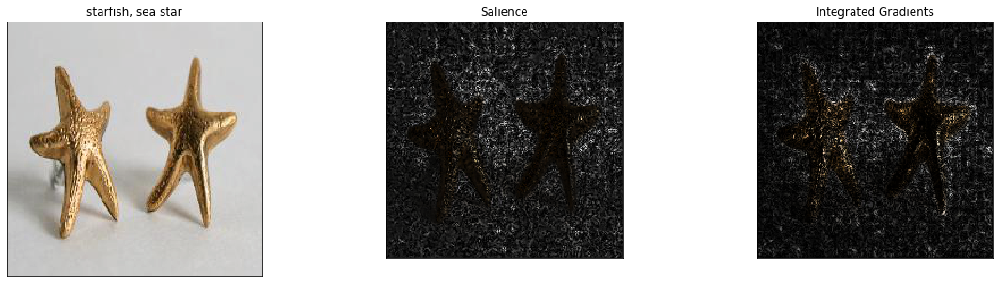

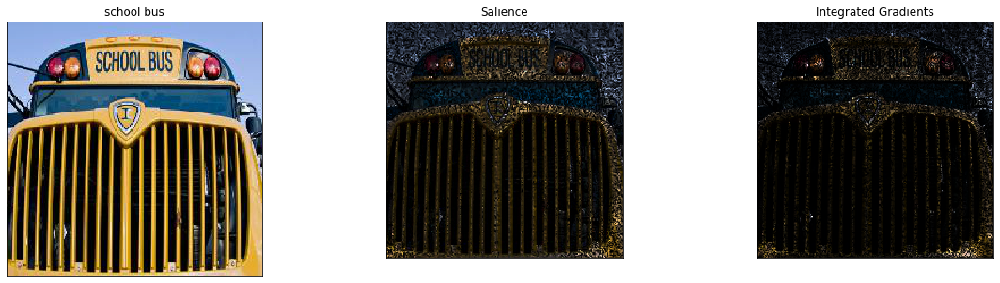

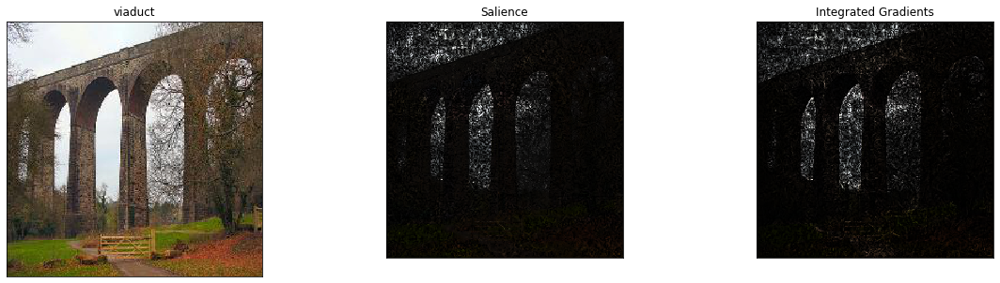

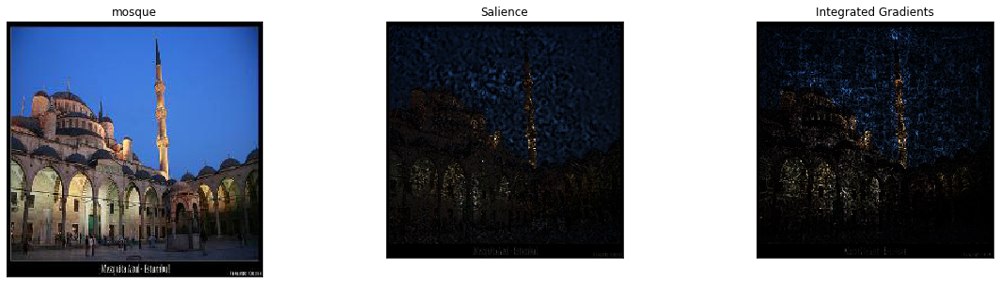

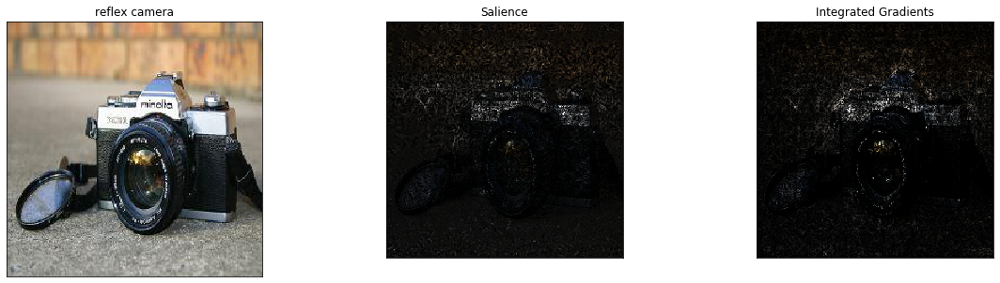

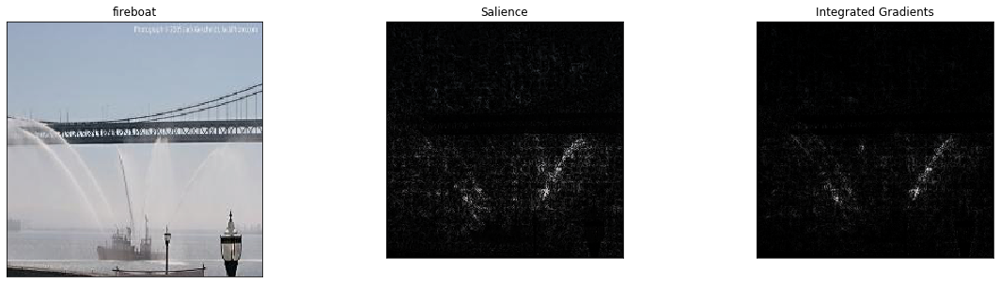

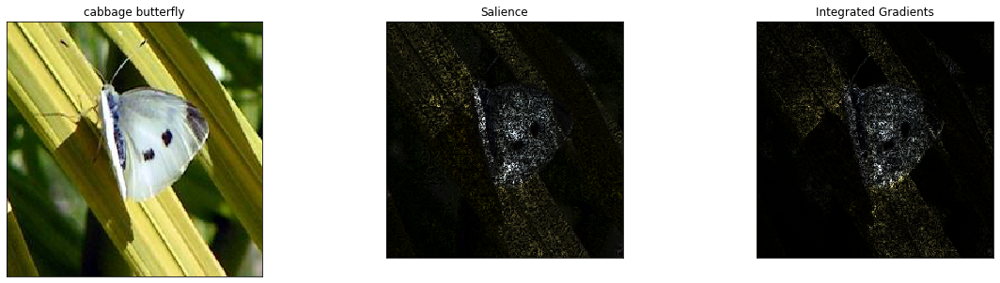

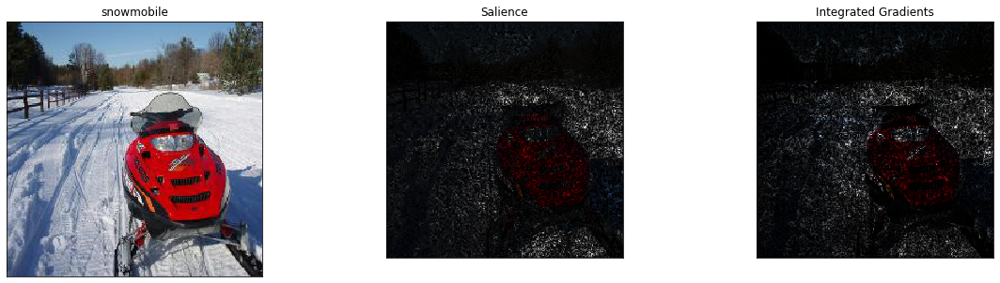

In [107]:
def visualize(img_input, attributions, method_sign, cmap=None, titles=None, bloom=.01, img_reference=None):
    for i in range(img_input.shape[0]):
        fig, ax = plt.subplots(1,len(attributions)+1, figsize=(20,5))
        
        img = unnormalize(img_input[i])
        if img_reference is not None:
            ref = img_reference[i]
        else:
            ref = img
        img = np.transpose(img.detach().numpy(), (1,2,0))
        ref = np.transpose(ref.detach().numpy(), (1,2,0))
        viz.visualize_image_attr(
             ref*0,
             ref,
             method='original_image',
             sign='all',
             #cmap='bwr',
             title=imagenet_labels[label_idx[i].item()] if img_reference is None else titles[-1],
             plt_fig_axis=(fig,ax[0]),
             use_pyplot=False)
        white = torch.ones_like(attributions[0][0])
        for j, attr in enumerate(attributions):
            viz.visualize_image_attr(
                 np.transpose((attr[i]*(1-bloom) + white*bloom).detach().numpy(), (1,2,0)),
                 img,
                 method=method_sign[0],
                 sign=method_sign[1],
                 cmap=None,
                 show_colorbar=True,
                 alpha_overlay=.5,
                 outlier_perc=1,
                 title=titles[j] if titles else None,
                 plt_fig_axis=(fig,ax[j+1]),
                 use_pyplot=False)
            ax[j+1].set_facecolor('black')
        plt.show()

HEATMAP_ALL = ['heat_map', 'all']
ALPHA_ABS = ['alpha_scaling', 'absolute_value']

visualize(img_input,
          [attributions_g * img_input, attributions_ig],
          ALPHA_ABS,
          titles=['Salience', 'Integrated Gradients'])

Individual gradients appear to have grid-like artifacts, which I thought might be due to batching. However this pattern persisted when isolating the input with some slight discrepancy, so I conclude this is a result of the JPG encoding more than anything else.

tensor(0.0999, grad_fn=<DivBackward0>)


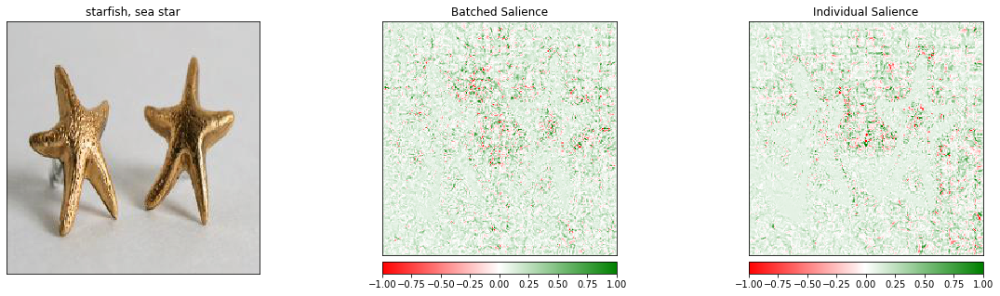

In [108]:
#attributions_g2 = salience(img_input[:1], target=label_idx[:1])
attributions_g2 = Salience(googlenet, True)(img_input[:1], target=label_idx[:1])
print(((attributions_g[0] - attributions_g2[0])**2).sum() / sum(attributions_g2.shape))
visualize(img_input[:1],
          [attributions_g * img_input, attributions_g2 * img_input],
          HEATMAP_ALL,
          titles=['Batched Salience', 'Individual Salience'])

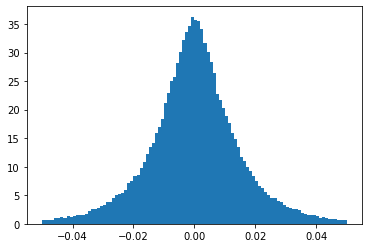

In [109]:
plt.hist((attributions_g2[0] - attributions_g[0]).flatten().detach().numpy(),
         bins=100, range=(-.05, .05), density=True);

How sensitive are these images to the choice of baseline?

In [22]:
def image_from_color(like, color):
    return color.repeat(int(np.prod(like.shape)/3)).view(like.shape)

integrated_gradients = IntegratedGradients(googlenet, n_steps=50)
mean_image = image_from_color(img_input[0], img_input[0].mean(1).mean(1))
min_image = image_from_color(img_input[0], img_input[0].min(1).values.min(1).values)
attributions = [
    integrated_gradients(img_input[:1], target=label_idx[:1], baseline=None),
    integrated_gradients(img_input[:1], target=label_idx[:1], baseline=min_image),
    integrated_gradients(img_input[:1], target=label_idx[:1], baseline='random'),
    integrated_gradients(img_input[:1], target=label_idx[:1], baseline=img_input[1]),
    integrated_gradients(img_input[:1], target=label_idx[:1], baseline=mean_image),
]

100%|██████████| 50/50 [00:20<00:00,  2.42it/s]


0.9995155 -0.00045549773


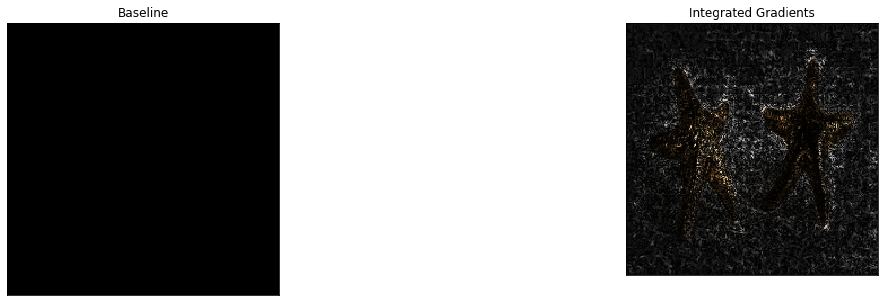

0.9995155 -0.00045549773


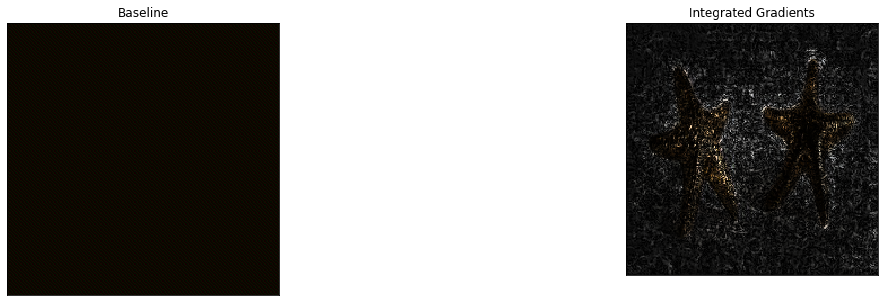

0.9995155 -0.00045549773


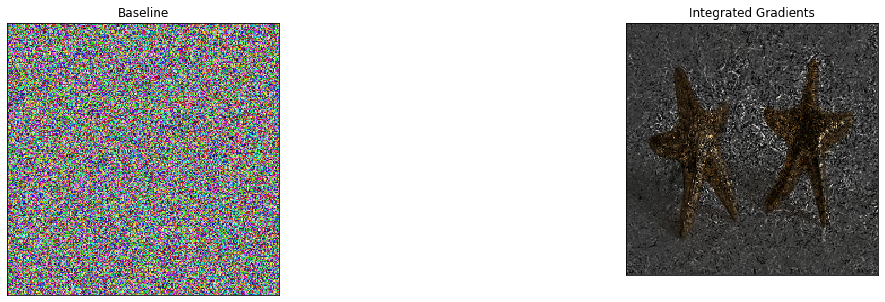

0.9995155 -0.00045549773


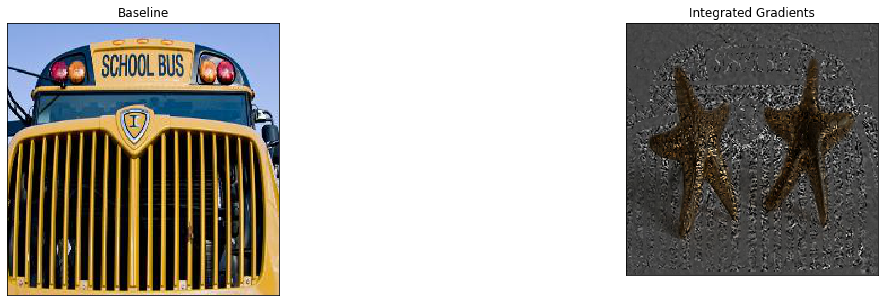

0.9995155 -0.00045549773


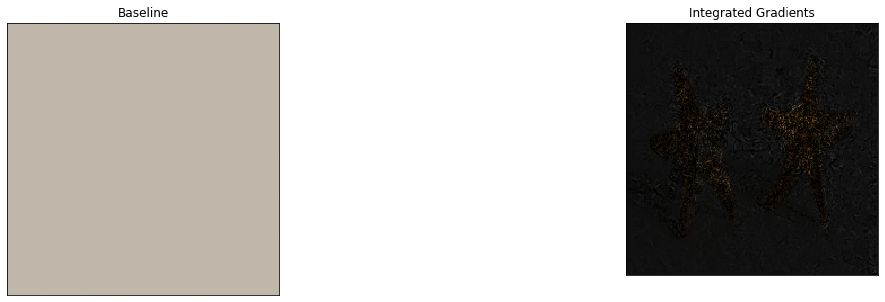

In [63]:
visualize(torch.stack([img_input[0]]*len(attributions)), [[a[0] for a in attributions]], ALPHA_ABS,
          titles=['Integrated Gradients', 'Baseline'],
          img_reference=[unnormalize(a.baseline) for a in attributions])

Observing the above outputs, and comparing to the reference images in the original Integrated Gradients paper, while the Salience maps already capture of of the edges and features present in the image, Integrated Gradients is more focused on the key portions of the image and not so spread out.

In [383]:
class ExpectedGradients:
    pass

class SmoothGrad:
    pass

class GaussianNoise:
    pass

class Convolution:
    pass

class IntegratedHessian:
    pass

Defining dissimilarity measures

In [24]:
class TopK(torch.nn.Module):

    def __init__(self, k):
        torch.nn.Module.__init__(self)
        self.k = k
        
    def set_test(self, importances):
        self.test = importances
        with torch.no_grad():
            self.filter = self.topk_filter(self.test)
    
    def topk_filter(self, importances):
        # Get indices of top k importances
        importances = importances.abs().sum(-3).flatten()
        topk_idx = torch.topk(importances, self.k).indices
        filter = torch.zeros_like(importances)
        filter[topk_idx] = 1
        return filter
        
    def forward(self, importances, test=None):
        if test is not None:
            self.set_test(test)
        return -torch.sum(importances.abs().sum(-3).flatten() * self.filter)
        

class MassCenter(torch.nn.Module):
    """L2 distance between mass centers of saliencies"""
    
    def __init__(self, WH):
        indices = torch.arange(WH[0]), torch.arange(WH[1])
        self.ymesh, self.xmesh = torch.meshgrid(indices)
        self.ymesh = self.ymesh
        self.xmesh = self.xmesh
    
    def set_test(self, importances):
        torch.nn.Module.__init__(self)
        self.test = importances
        with torch.no_grad():
            self.test_cm = self.mass_center(importances)

    def mass_center(self, importances):
        return torch.stack([
            torch.sum(importances.abs()*self.xmesh),
            torch.sum(importances.abs()*self.ymesh)])
    
    def forward(self, importances, test=None):
        if test is not None:
            self.set_test(test)
        return torch.sum((self.test_cm - self.mass_center(importances))**2)

In [113]:
from torch.autograd import Variable, grad
import scipy.stats

class GradientSignAttack:
    '''Adversarial attack against feature-importance maps'''
    
    def __init__(self, attribution_method):
        self.method = attribution_method
    
    def forward(self, image, label_idx, requires_grad=True):
        return  self.method(image, label_idx, requires_grad=requires_grad, scores=True) # I(x^p)
    
    def fgsm(self, x, x0inv, grad, epsilon, step_size, min_x=0, max_x=1):
        xinv = unnormalize(x[0])
        # Create the perturbed image by adjusting each pixel of the input image according to element-wise sign
        # Adding clipping to maintain [0,1] range
        xinv += step_size*grad[0].sign()
        torch.clamp(xinv, min_x+.01, max_x-.01)
        # Clip the perturbed input to satisfy the norm constraint
        delta = xinv - x0inv
        if delta.abs().max() > epsilon:
            torch.clamp(delta, -epsilon, epsilon, out=delta)
            torch.add(x0inv, delta, out=xinv)
        x_prime = normalize(xinv)
        step = (x_prime-x).abs().max()
        x.data[0] = x_prime
        return x, delta.abs().max(), step.abs().max()
    
    def iterative(self, image, label_idx, epsilon, dissimilarity, num_steps, step_size):
        attrs0 = self.forward(image, label_idx).detach()
        with torch.no_grad():
            targets = getattr(attrs0, 'targets', None)
            image_inv = unnormalize(image[0])
            perturbed_image = Variable(image.clone(), requires_grad=True) # x^p
            dissimilarity.set_test(attrs0) # I(x_t)
        for _ in range(num_steps):
            attrs = self.forward(perturbed_image, label_idx)
            loss = dissimilarity(attrs) # D(x_t,x^{p-1})
            
            print("computing gradient")
            # Zero all existing gradients
            self.method.zero_grad()
            # Calculate gradients of model in backward pass
            loss.backward()
            input_grad = perturbed_image.grad
            if input_grad is not None:
                input_grad = input_grad.data
            else: # zero gradient, i.e. we have reached an extrema
                break
            
            K = 1000
            with torch.no_grad():
                print("prediction confidence =", attrs.input_scores[0, label_idx].item())
                print("loss =", loss.item())

                print("taking step")
                perturbed_image, delta = self.fgsm(perturbed_image, image_inv, input_grad, epsilon, step_size)

                print("rank correlation =", scipy.stats.spearmanr(
                    attrs.flatten().data, attrs0.flatten().data))
                """% of the k most salient pixels in the original image are among {} most salient pixels of the 
                perturbed image"""
                print(f"top-{K} intersection =", len(
                    set(torch.topk(attrs0.abs().sum(-3).flatten(), K).indices.detach().numpy()) &
                    set(torch.topk(attrs.abs().sum(-3).flatten(), K).indices.detach().numpy())))
                print("epsilon =", delta.abs().max())
                visualize(image, [attrs], ALPHA_ABS,
                  titles=['Attribution', 'Pertubation'],
                  img_reference=list(map(unnormalize, perturbed_image)),
                  bloom=0)

        # Return the perturbed image
        return perturbed_image

In [114]:
attack = GradientSignAttack(Salience(googlenet, True, True)) #n_steps=50
topk = TopK(1000) # Recommended for ImageNet
com = MassCenter(WH=img_input.shape[-2:])

In [112]:
torch.autograd.set_detect_anomaly(True)
topk_img = attack.iterative(
    img_input[:1], label_idx[0], # reference image
    num_steps=300, # number of iterations P
    step_size=.5/255, # alpha
    epsilon=8/255, # Maximum allowed perturbation for each pixel
    dissimilarity=topk)

AttributeError: 'Tensor' object has no attribute 'copy'

In [122]:
original, perturbed = attack.method(torch.stack([img_input[0], topk_img[0]]), label_idx[0])
red, green, blue = torch.zeros((3, 244*244))
red[torch.topk(original.abs().sum(-3).flatten(), 1000).indices] = 1
blue[torch.topk(perturbed.abs().sum(-3).flatten(), 1000).indices] = 1

ValueError: axes don't match array

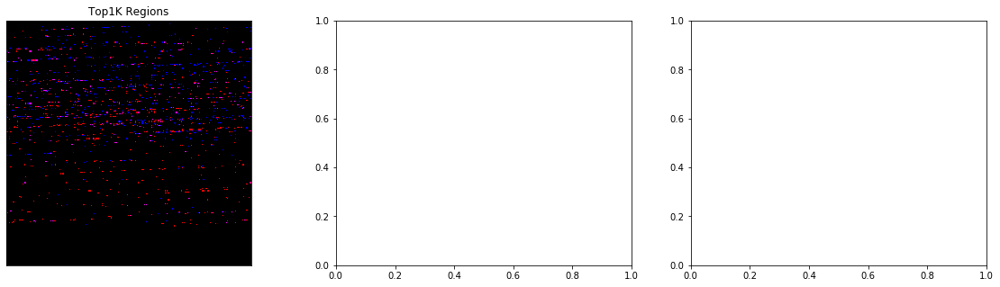

In [123]:
regions = torch.stack([red, green, blue]).view(3, 244, 244)
visualize(img_input[:1], [original, perturbed], ALPHA_ABS,
         titles = ['Original', 'Pertubation', 'Top1K Regions'],
         img_reference=[regions], bloom=0)

computing gradient
prediction confidence = 0.9940211176872253
loss = 0.0
taking step
rank correlation = SpearmanrResult(correlation=1.0, pvalue=0.0)
top-1000 intersection = 1000
epsilon = tensor(0.)


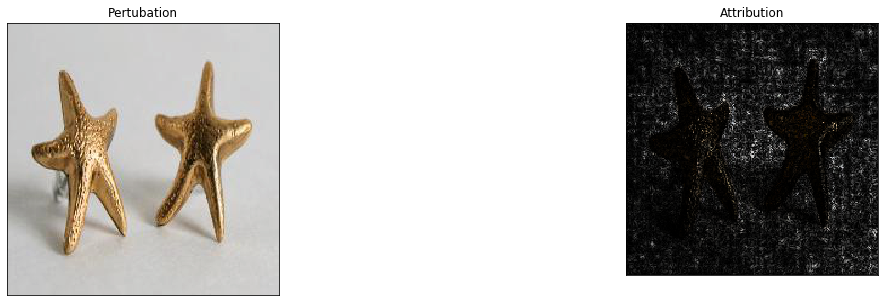

computing gradient
prediction confidence = 0.9940211176872253
loss = 8.971255738288164e-06
taking step
rank correlation = SpearmanrResult(correlation=0.9999961221176261, pvalue=0.0)
top-1000 intersection = 1000
epsilon = tensor(0.0020)


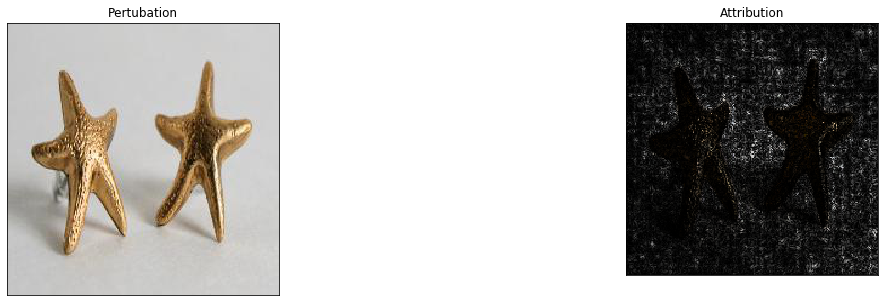

computing gradient
prediction confidence = 0.9938044548034668
loss = 0.3896366357803345
taking step
rank correlation = SpearmanrResult(correlation=0.9477860687362445, pvalue=0.0)
top-1000 intersection = 773
epsilon = tensor(0.0039)


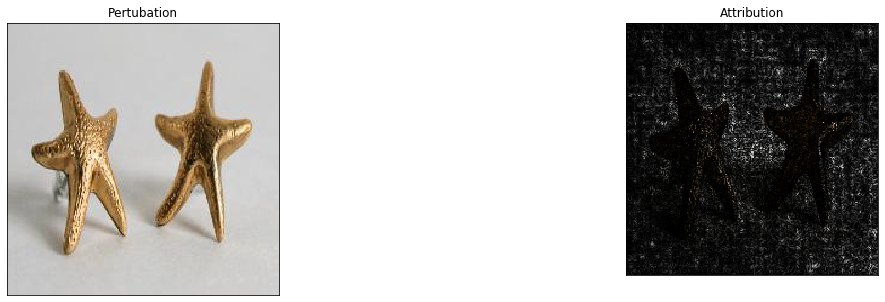

computing gradient
prediction confidence = 0.9936896562576294
loss = 0.5250945687294006
taking step
rank correlation = SpearmanrResult(correlation=0.9020434702439555, pvalue=0.0)
top-1000 intersection = 678
epsilon = tensor(0.0059)


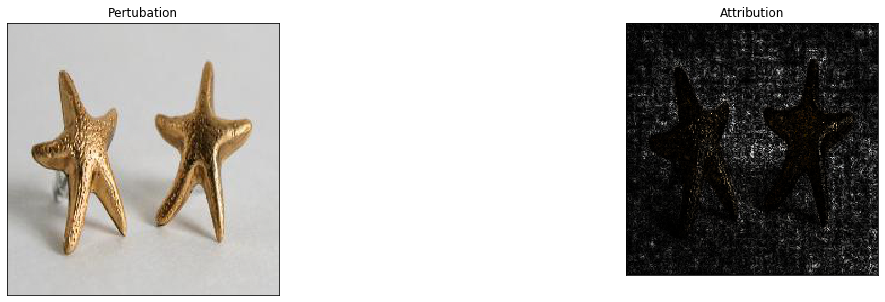

computing gradient
prediction confidence = 0.9939291477203369
loss = 0.2578430771827698
taking step
rank correlation = SpearmanrResult(correlation=0.768658815009484, pvalue=0.0)
top-1000 intersection = 544
epsilon = tensor(0.0078)


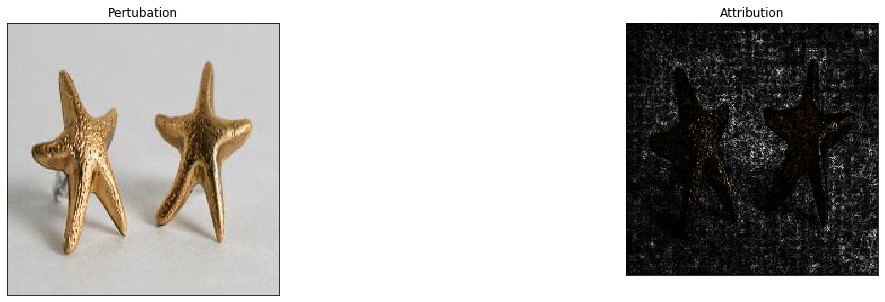

computing gradient
prediction confidence = 0.9941802024841309
loss = 1.019120693206787
taking step
rank correlation = SpearmanrResult(correlation=0.6761765174800461, pvalue=0.0)
top-1000 intersection = 474
epsilon = tensor(0.0098)


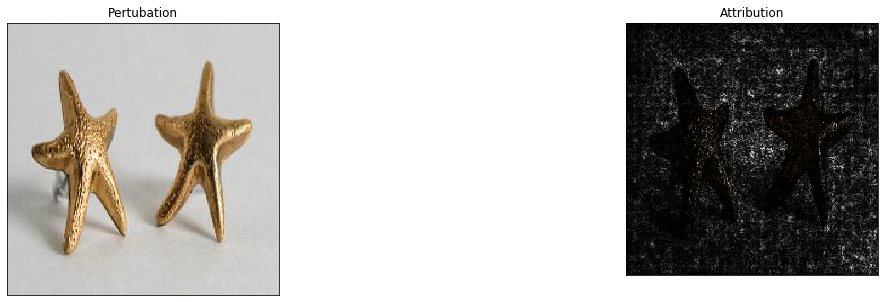

computing gradient
prediction confidence = 0.9942992925643921
loss = 3.596261739730835
taking step
rank correlation = SpearmanrResult(correlation=0.6098441852035411, pvalue=0.0)
top-1000 intersection = 436
epsilon = tensor(0.0118)


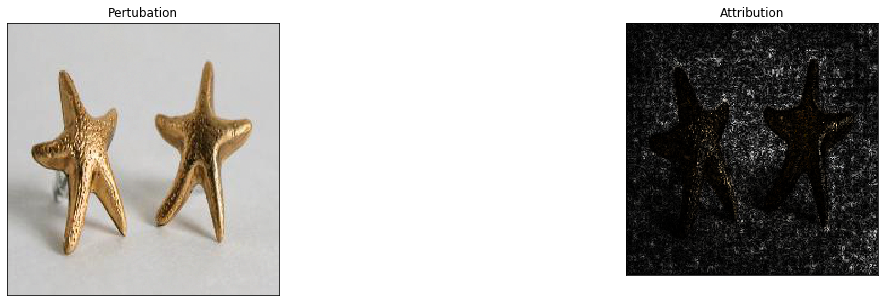

computing gradient
prediction confidence = 0.9945059418678284
loss = 4.618006229400635
taking step
rank correlation = SpearmanrResult(correlation=0.5568062128463053, pvalue=0.0)
top-1000 intersection = 410
epsilon = tensor(0.0137)


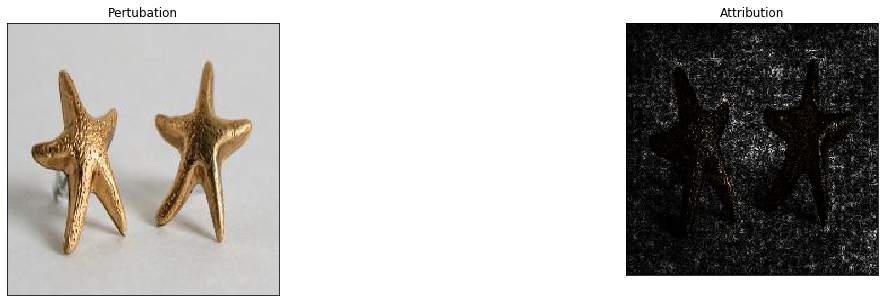

computing gradient
prediction confidence = 0.9945153594017029
loss = 5.031797409057617
taking step
rank correlation = SpearmanrResult(correlation=0.5344810159944575, pvalue=0.0)
top-1000 intersection = 409
epsilon = tensor(0.0157)


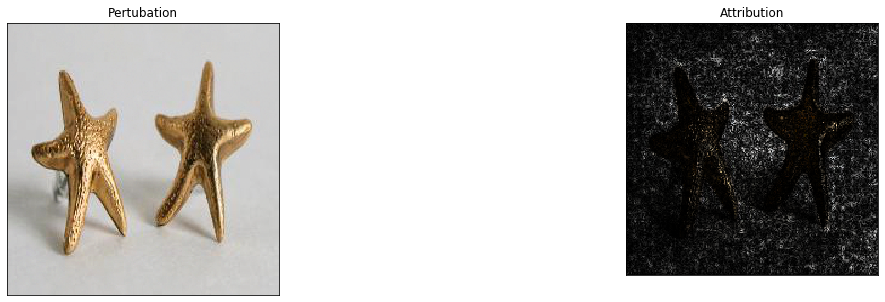

computing gradient
prediction confidence = 0.9945658445358276
loss = 4.1564531326293945
taking step
rank correlation = SpearmanrResult(correlation=0.5194932655319366, pvalue=0.0)
top-1000 intersection = 411
epsilon = tensor(0.0176)


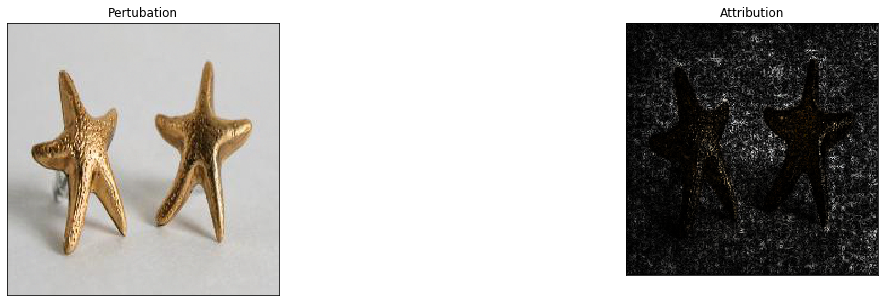

computing gradient
prediction confidence = 0.9945909976959229
loss = 9.478365898132324
taking step
rank correlation = SpearmanrResult(correlation=0.5100973957161323, pvalue=0.0)
top-1000 intersection = 383
epsilon = tensor(0.0196)


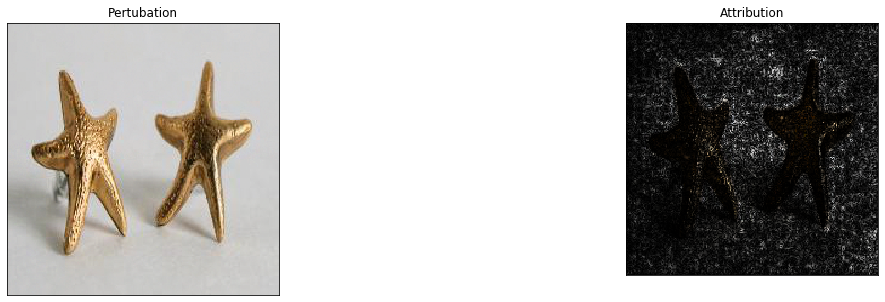

computing gradient
prediction confidence = 0.9946718811988831
loss = 14.530961036682129
taking step
rank correlation = SpearmanrResult(correlation=0.5010902079178751, pvalue=0.0)
top-1000 intersection = 360
epsilon = tensor(0.0216)


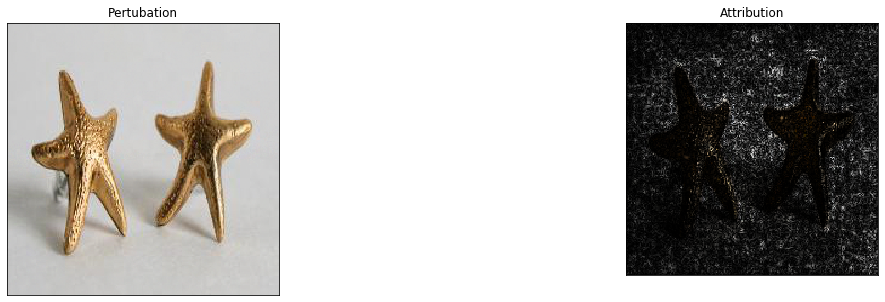

computing gradient
prediction confidence = 0.9946507811546326
loss = 23.054540634155273
taking step
rank correlation = SpearmanrResult(correlation=0.48406265614515, pvalue=0.0)
top-1000 intersection = 328
epsilon = tensor(0.0235)


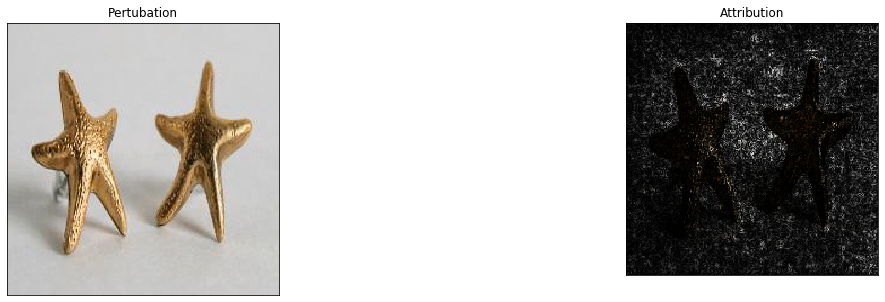

computing gradient
prediction confidence = 0.9946035742759705
loss = 23.465837478637695
taking step
rank correlation = SpearmanrResult(correlation=0.47265417845940455, pvalue=0.0)
top-1000 intersection = 316
epsilon = tensor(0.0255)


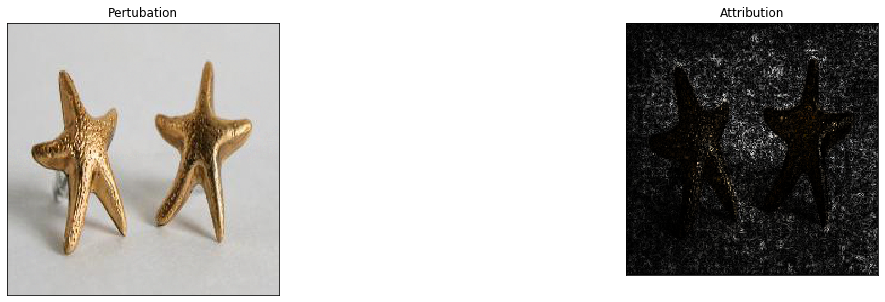

computing gradient
prediction confidence = 0.9945986270904541
loss = 31.090139389038086
taking step
rank correlation = SpearmanrResult(correlation=0.4655677021333949, pvalue=0.0)
top-1000 intersection = 297
epsilon = tensor(0.0275)


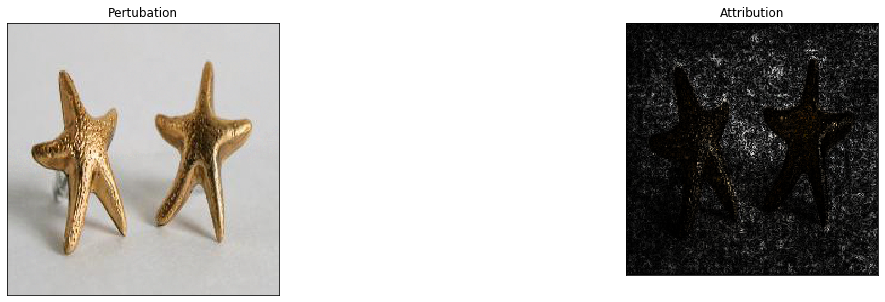

computing gradient
prediction confidence = 0.9945547580718994
loss = 43.131168365478516
taking step
rank correlation = SpearmanrResult(correlation=0.4526695944546365, pvalue=0.0)
top-1000 intersection = 294
epsilon = tensor(0.0294)


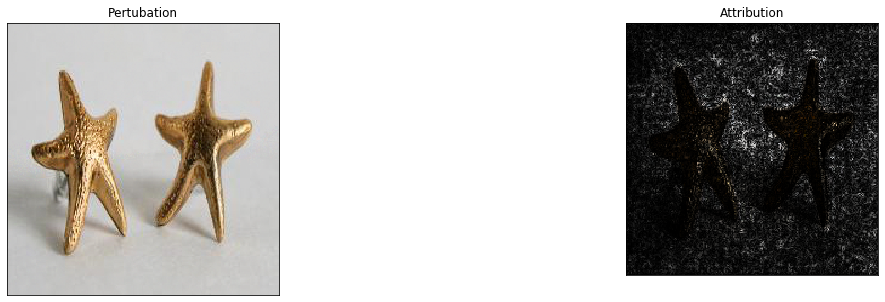

computing gradient
prediction confidence = 0.9945344924926758
loss = 40.529273986816406
taking step
rank correlation = SpearmanrResult(correlation=0.4394981573476585, pvalue=0.0)
top-1000 intersection = 291
epsilon = tensor(0.0314)


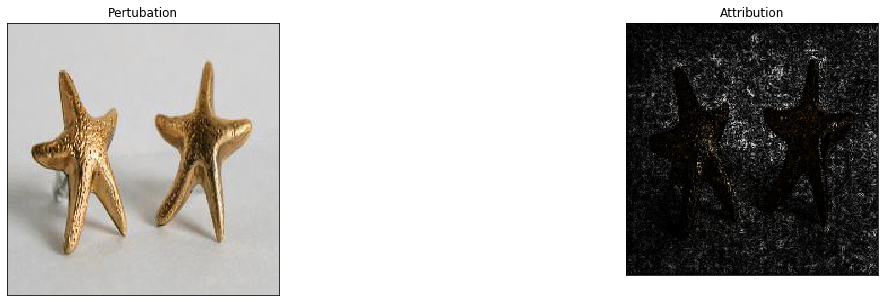

computing gradient
prediction confidence = 0.9945900440216064
loss = 35.583457946777344
taking step
rank correlation = SpearmanrResult(correlation=0.42863416579396163, pvalue=0.0)
top-1000 intersection = 290
epsilon = tensor(0.0314)


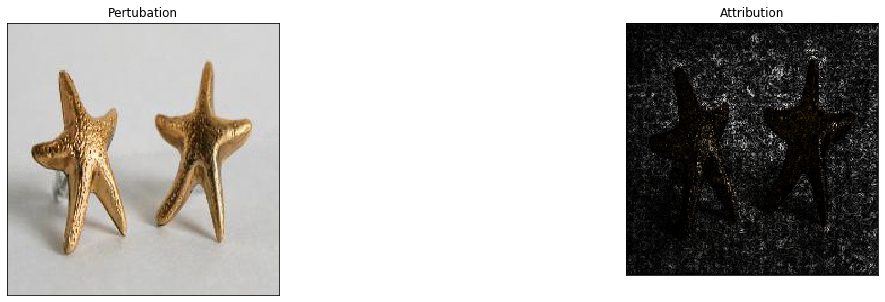

computing gradient
prediction confidence = 0.994574785232544
loss = 38.609371185302734
taking step
rank correlation = SpearmanrResult(correlation=0.41869807439305584, pvalue=0.0)
top-1000 intersection = 257
epsilon = tensor(0.0314)


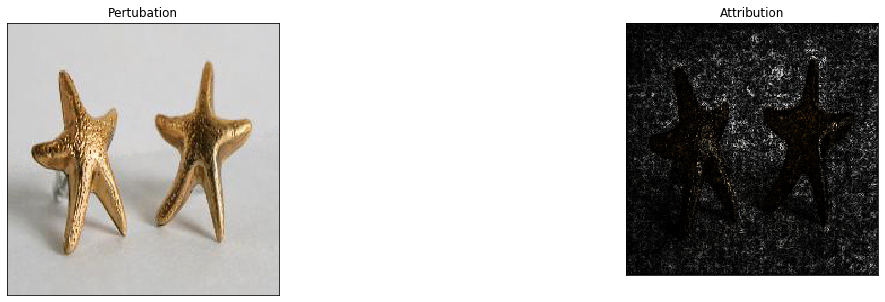

computing gradient
prediction confidence = 0.9945313930511475
loss = 39.30955505371094
taking step
rank correlation = SpearmanrResult(correlation=0.4085741195642123, pvalue=0.0)
top-1000 intersection = 258
epsilon = tensor(0.0314)


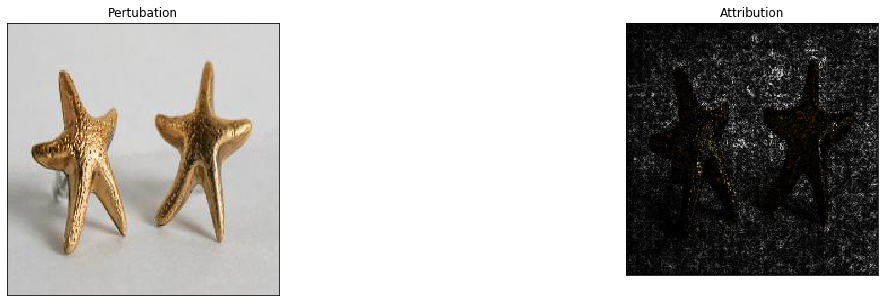

computing gradient
prediction confidence = 0.9946377873420715
loss = 33.23257064819336
taking step
rank correlation = SpearmanrResult(correlation=0.3983259085198026, pvalue=0.0)
top-1000 intersection = 249
epsilon = tensor(0.0314)


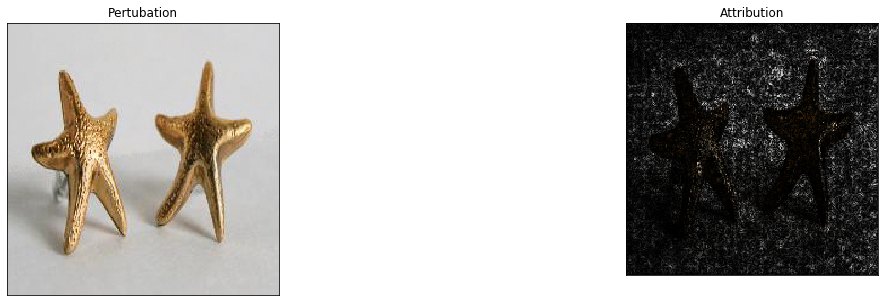

computing gradient
prediction confidence = 0.9946984052658081
loss = 34.77901840209961
taking step
rank correlation = SpearmanrResult(correlation=0.3890756833505163, pvalue=0.0)
top-1000 intersection = 255
epsilon = tensor(0.0314)


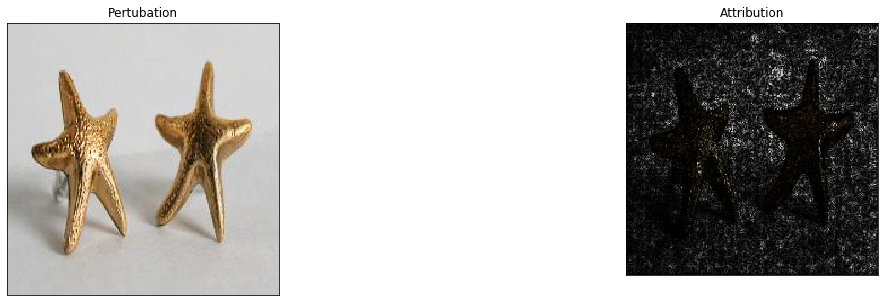

computing gradient
prediction confidence = 0.9946833252906799
loss = 45.94124984741211
taking step
rank correlation = SpearmanrResult(correlation=0.39499411775252147, pvalue=0.0)
top-1000 intersection = 238
epsilon = tensor(0.0314)


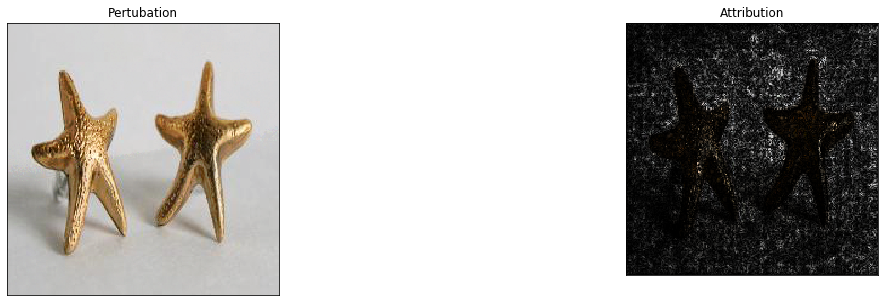

computing gradient
prediction confidence = 0.9947096109390259
loss = 46.28056716918945
taking step
rank correlation = SpearmanrResult(correlation=0.39795211807836617, pvalue=0.0)
top-1000 intersection = 244
epsilon = tensor(0.0314)


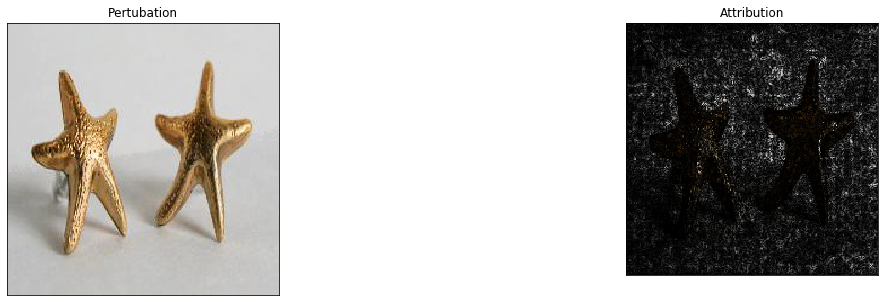

computing gradient
prediction confidence = 0.9945746064186096
loss = 37.85249710083008
taking step
rank correlation = SpearmanrResult(correlation=0.4145134619655871, pvalue=0.0)
top-1000 intersection = 257
epsilon = tensor(0.0314)


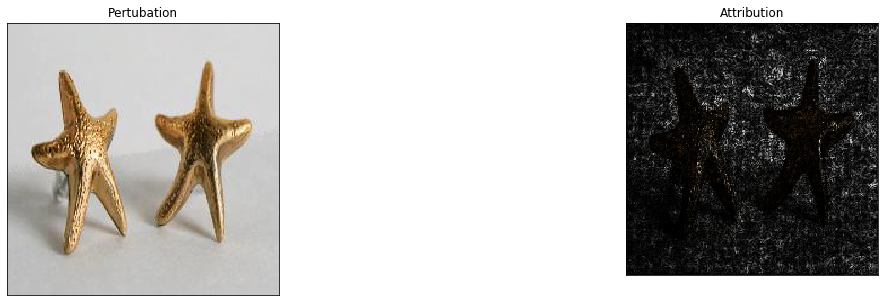

In [116]:
topk_img = attack.iterative(
    img_input[:1], label_idx[0],
    num_steps=25,
    step_size=.5/255,
    epsilon=8/255,
    dissimilarity=com)